# Endothelial Cell Compartment

In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import scipy.io
import matplotlib.pyplot as plt
import os
import anndata


In [30]:
sc.settings.set_figure_params(dpi=300,fontsize=10)

In [3]:
adata=sc.read_h5ad('/rds/general/user/snb20/projects/cardiac_single_cell_biology/live/sanger_covid19_snRNAseq/lung/lung_v2/object_anno/ec_object.h5ad')

In [4]:
adata

AnnData object with n_obs × n_vars = 63841 × 34091
    obs: 'nCount_RNA', 'nFeature_RNA', 'cell.id', 'study.batch', 'donor', 'samples', 'sex', 'age', 'ethnicity', 'smoking_status', 'health_status', 'region', 'version_10X', 'scn_source', 'cell_type_bharat20', 'cell_states_bharat20', 'cell_type_delorey21', 'cell_states_delorey21', 'cell_type_melms21', 'cell_states_melms21', 'cell_type_SatijaAtlas', 'original_annotation', 'scn_source_study.batch', 'donor_study.batch', 'samples_study.batch', 'percent_mito', 'percent_ribo', 'scrublet.scores_samples', 'scrublet.predicted_db_samples', 'scDblFinder.score_samples', 'scDblFinder.predicted_db_samples', 'nCount_SCT', 'nFeature_SCT', 'integrated_snn_res.0.1', 'seurat_clusters', 'health_status_entropy.seurat', 'scn_source_entropy.seurat', 'scn_source_study.batch_entropy.seurat', 'donor_study.batch_entropy.seurat', 'samples_study.batch_entropy.seurat', 'health_status_entropy.seurat.hm', 'scn_source_entropy.seurat.hm', 'scn_source_study.batch_entropy.

In [5]:

cluster2annotation = {
    'EC.Venous.Pulmonary': 'EC.Venous.Pul',
    'EC.Venous.Systemic': 'EC.Venous.Sys',
    'EC.Aerocyte': 'EC.Aerocyte',
    'EC.Arterial': 'EC.Arterial',
    'EC.Capillary': 'EC.Capillary',
    'EC.Doublets': 'EC.Doublets',
    'EC.Lymphatic': 'EC.Lymphatic',
}

# add a new `.obs` column called `cell type` by mapping clusters to annotation using pandas `map` function
adata.obs['cell_states'] = adata.obs['leiden_anno'].map(cluster2annotation).astype('category')

/rds/general/user/snb20/home/anaconda3/envs/MiloPy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):
/rds/general/user/snb20/home/anaconda3/envs/MiloPy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1216: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/rds/general/user/snb20/home/anaconda3/envs/MiloPy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


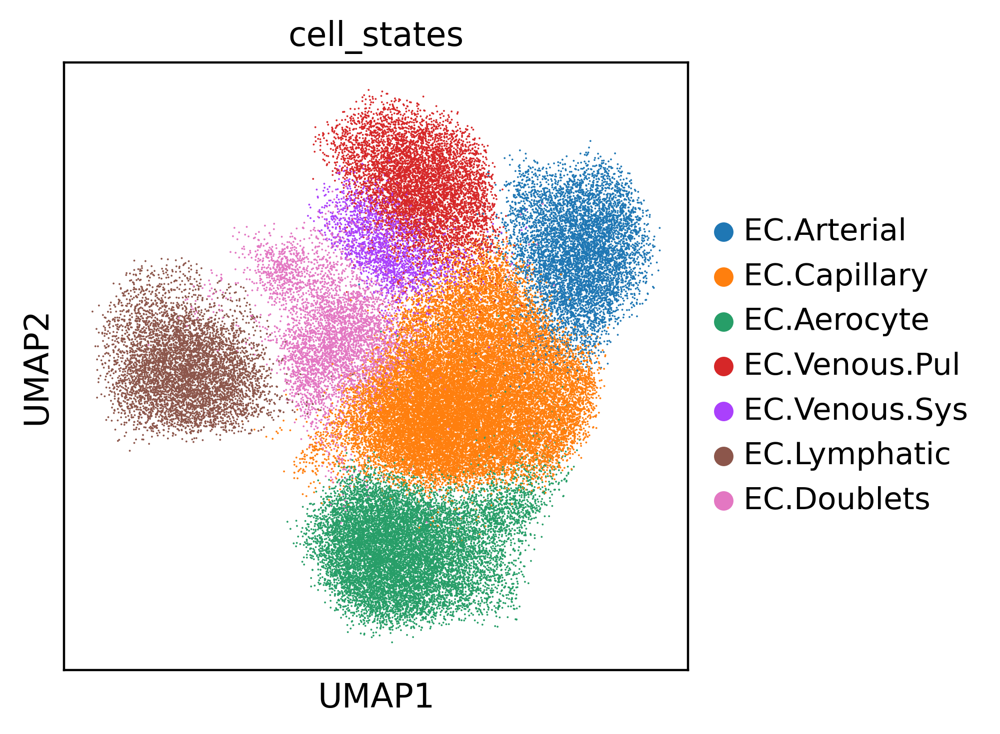

In [6]:
sc.pl.umap(adata, color = 'cell_states')

In [7]:
adata_ec = adata[adata.obs["cell_states"].isin(["EC.Arterial","EC.Capillary","EC.Aerocyte","EC.Venous.Pul", "EC.Venous.Sys", "EC.Lymphatic"])].copy()

/rds/general/user/snb20/home/anaconda3/envs/MiloPy/lib/python3.9/site-packages/anndata/_core/anndata.py:1113: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


/rds/general/user/snb20/home/anaconda3/envs/MiloPy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):
/rds/general/user/snb20/home/anaconda3/envs/MiloPy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1216: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/rds/general/user/snb20/home/anaconda3/envs/MiloPy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


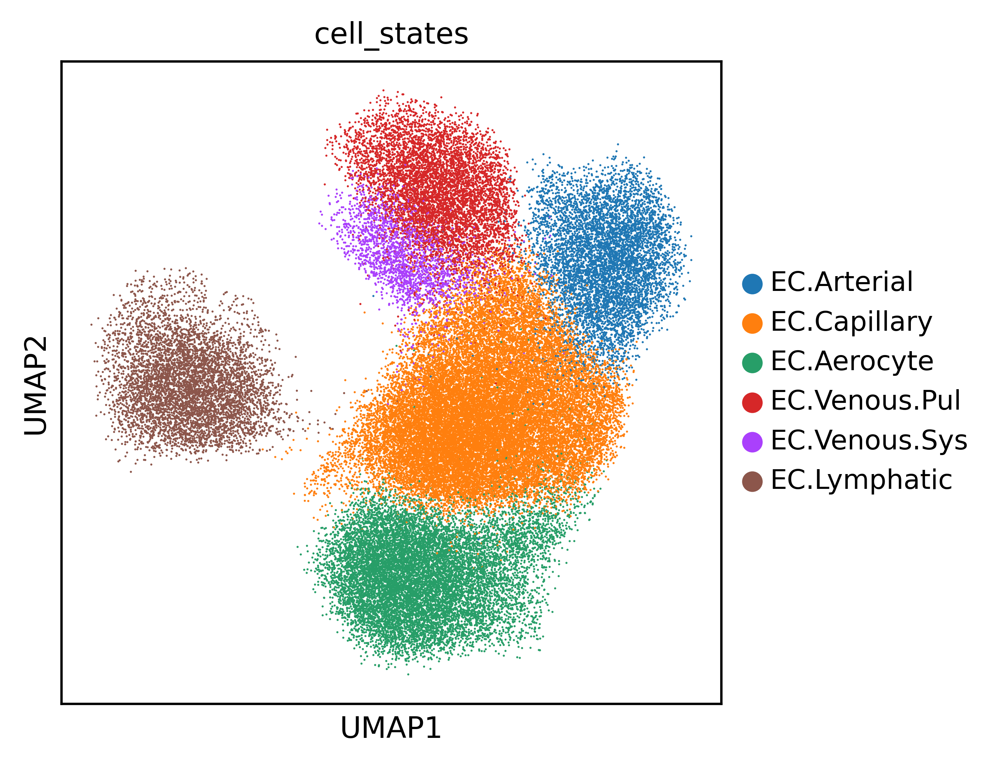

In [43]:
sc.pl.umap(adata_ec, color = "cell_states")

/rds/general/user/snb20/home/anaconda3/envs/MiloPy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):
/rds/general/user/snb20/home/anaconda3/envs/MiloPy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1216: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/rds/general/user/snb20/home/anaconda3/envs/MiloPy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


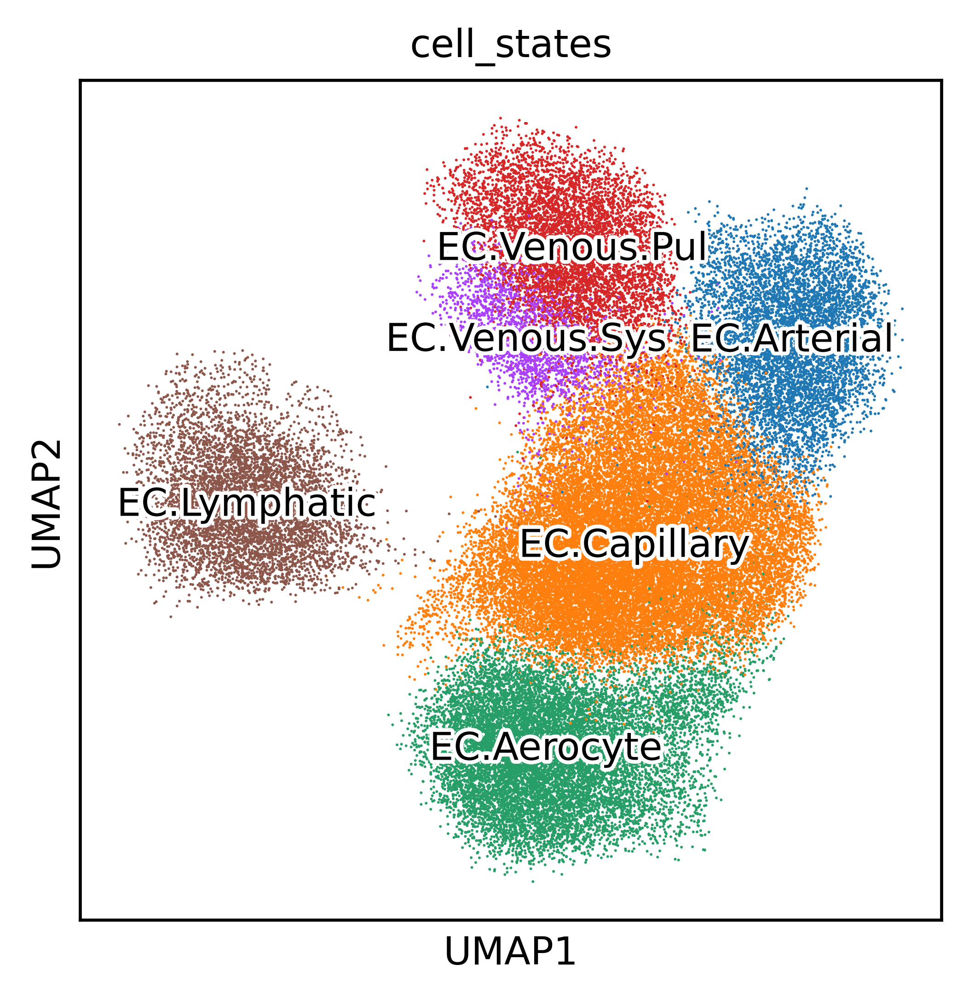

In [42]:
sc.pl.umap(adata_ec, color = "cell_states", legend_loc = 'on data', legend_fontweight = 'normal', legend_fontoutline = 2)

In [9]:
import numpy as np
import pandas as pd
import scanpy as sc
import anndata
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize']=(8,8) #rescale figures
sc.settings.verbosity = 3

import milopy.core as milo
import milopy.plot as milopl

/bin/sh: which: line 1: syntax error: unexpected end of file
/bin/sh: error importing function definition for `which'
/bin/sh: module: line 1: syntax error: unexpected end of file
/bin/sh: error importing function definition for `module'
/bin/sh: scl: line 1: syntax error: unexpected end of file
/bin/sh: error importing function definition for `scl'
/bin/sh: ml: line 1: syntax error: unexpected end of file
/bin/sh: error importing function definition for `ml'
sh: which: line 1: syntax error: unexpected end of file
sh: error importing function definition for `which'
sh: module: line 1: syntax error: unexpected end of file
sh: error importing function definition for `module'
sh: scl: line 1: syntax error: unexpected end of file
sh: error importing function definition for `scl'
sh: ml: line 1: syntax error: unexpected end of file
sh: error importing function definition for `ml'
sh: which: line 1: syntax error: unexpected end of file
sh: error importing function definition for `which'
sh: 

In [10]:
import seaborn as sns

In [11]:
adata_orig = adata

In [12]:
adata_ec

AnnData object with n_obs × n_vars = 59175 × 34091
    obs: 'nCount_RNA', 'nFeature_RNA', 'cell.id', 'study.batch', 'donor', 'samples', 'sex', 'age', 'ethnicity', 'smoking_status', 'health_status', 'region', 'version_10X', 'scn_source', 'cell_type_bharat20', 'cell_states_bharat20', 'cell_type_delorey21', 'cell_states_delorey21', 'cell_type_melms21', 'cell_states_melms21', 'cell_type_SatijaAtlas', 'original_annotation', 'scn_source_study.batch', 'donor_study.batch', 'samples_study.batch', 'percent_mito', 'percent_ribo', 'scrublet.scores_samples', 'scrublet.predicted_db_samples', 'scDblFinder.score_samples', 'scDblFinder.predicted_db_samples', 'nCount_SCT', 'nFeature_SCT', 'integrated_snn_res.0.1', 'seurat_clusters', 'health_status_entropy.seurat', 'scn_source_entropy.seurat', 'scn_source_study.batch_entropy.seurat', 'donor_study.batch_entropy.seurat', 'samples_study.batch_entropy.seurat', 'health_status_entropy.seurat.hm', 'scn_source_entropy.seurat.hm', 'scn_source_study.batch_entropy.

In [13]:
sc.pp.neighbors(adata_ec, n_neighbors = 150, n_pcs = 30, use_rep = 'X_harmony')

computing neighbors


/rds/general/user/snb20/home/anaconda3/envs/MiloPy/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:01:54)


In [14]:
milo.make_nhoods(adata_ec, prop=0.1)

/rds/general/user/snb20/home/anaconda3/envs/MiloPy/lib/python3.9/site-packages/milopy/core.py:125: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[12.14810562 10.89200592 10.95355701 ...  9.06635857  8.15704823
  9.38045502]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  adata.obs.loc[adata.obs["nhood_ixs_refined"]


In [15]:
adata_ec.obsm["nhoods"]

<59175x2249 sparse matrix of type '<class 'numpy.float32'>'
	with 1078328 stored elements in Compressed Sparse Row format>

In [16]:
adata_ec[adata_ec.obs['nhood_ixs_refined'] != 0].obs[['nhood_ixs_refined', 'nhood_kth_distance']]

/rds/general/user/snb20/home/anaconda3/envs/MiloPy/lib/python3.9/site-packages/anndata/_core/anndata.py:1113: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


,nhood_ixs_refined,nhood_kth_distance
HD67_GCGCGATAGACGCAAC_1_1,1,12.148106
HD68_AGCTCCTGTAAGTAGT_1_1,1,10.892006
HD70_CATCGAACAGTATAAG_1_1,1,10.953557
F01366_CAGGTGCGTGACGCCT_1_1,1,12.217417
081C_GACGTGCTCCAGATCA_2_1,1,7.453043
...,...,...
TGTTGGAGTGCTAGCC-1_3_1_5,1,6.902302
AAGATAGTCCCATACC-1_2_5,1,7.237426
GGTCACGGTACTTCCC-1_2_5,1,9.066359
TCATCATAGCTGTCCG-1_2_5,1,8.157048


In [17]:
adata

AnnData object with n_obs × n_vars = 63841 × 34091
    obs: 'nCount_RNA', 'nFeature_RNA', 'cell.id', 'study.batch', 'donor', 'samples', 'sex', 'age', 'ethnicity', 'smoking_status', 'health_status', 'region', 'version_10X', 'scn_source', 'cell_type_bharat20', 'cell_states_bharat20', 'cell_type_delorey21', 'cell_states_delorey21', 'cell_type_melms21', 'cell_states_melms21', 'cell_type_SatijaAtlas', 'original_annotation', 'scn_source_study.batch', 'donor_study.batch', 'samples_study.batch', 'percent_mito', 'percent_ribo', 'scrublet.scores_samples', 'scrublet.predicted_db_samples', 'scDblFinder.score_samples', 'scDblFinder.predicted_db_samples', 'nCount_SCT', 'nFeature_SCT', 'integrated_snn_res.0.1', 'seurat_clusters', 'health_status_entropy.seurat', 'scn_source_entropy.seurat', 'scn_source_study.batch_entropy.seurat', 'donor_study.batch_entropy.seurat', 'samples_study.batch_entropy.seurat', 'health_status_entropy.seurat.hm', 'scn_source_entropy.seurat.hm', 'scn_source_study.batch_entropy.

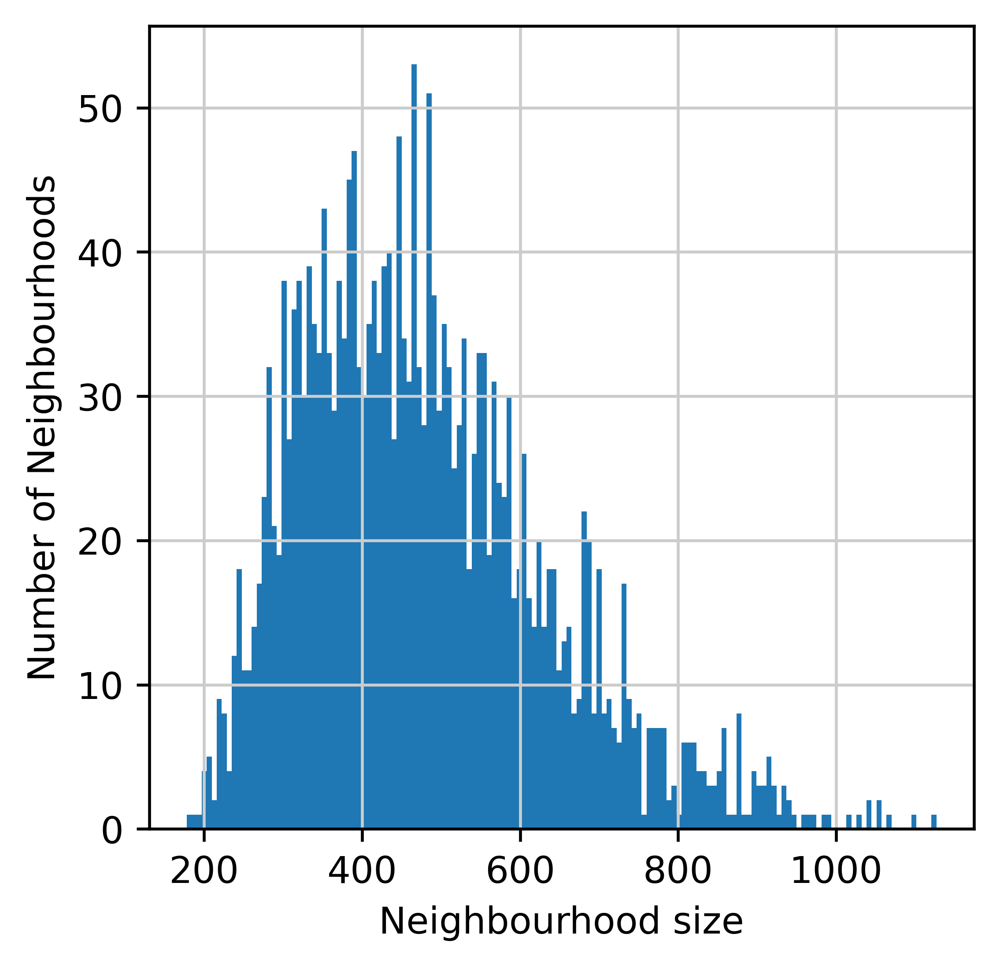

In [31]:
nhood_size = np.array(adata_ec.obsm["nhoods"].sum(0)).ravel()
plt.hist(nhood_size, bins=150);

plt.xlabel("Neighbourhood size");
plt.ylabel("Number of Neighbourhoods");

In [19]:
milo.count_nhoods(adata_ec, sample_col="samples")

In [20]:
adata_ec.uns["nhood_adata"]

AnnData object with n_obs × n_vars = 2249 × 159
    obs: 'index_cell', 'kth_distance'
    uns: 'sample_col'

In [21]:

cluster2annotation = {
    'COVID-19': 'COVID.19',
    'Healthy': 'Healthy',

}

# add a new `.obs` column called `cell type` by mapping clusters to annotation using pandas `map` function
adata_ec.obs['health_status'] = adata_ec.obs['health_status'].map(cluster2annotation).astype('category')

In [22]:
adata_ec.obs['health_status'] = adata_ec.obs['health_status'].cat.reorder_categories(['Healthy', 'COVID.19'])

/rds/general/user/snb20/home/anaconda3/envs/MiloPy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):
/rds/general/user/snb20/home/anaconda3/envs/MiloPy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1216: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/rds/general/user/snb20/home/anaconda3/envs/MiloPy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


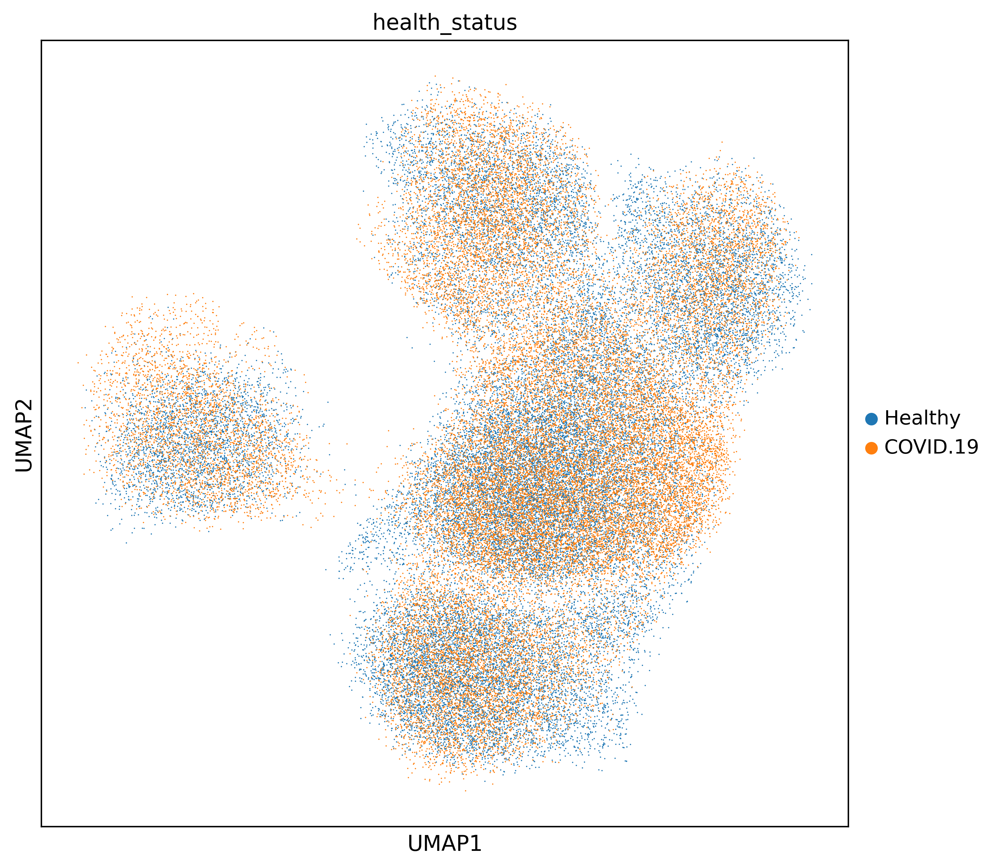

In [23]:
sc.pl.umap(adata_ec, color = 'health_status')

In [24]:
adata_ec.obs["health_status_continuous"] = adata_ec.obs["health_status"].cat.codes

In [25]:
milo.DA_nhoods(adata_ec, design="~health_status_continuous")

/rds/general/user/snb20/home/anaconda3/envs/MiloPy/lib/python3.9/site-packages/milopy/core.py:234: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  if design_df.dtypes[i].name == 'category':
/rds/general/user/snb20/home/anaconda3/envs/MiloPy/lib/python3.9/site-packages/milopy/core.py:306: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  pvalues = pvalues[keep_nhoods][o]
/rds/general/user/snb20/home/anaconda3/envs/MiloPy/lib/python3.9/site-packages/milopy/core.py:307: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent wit

In [26]:
adata_ec.uns["nhood_adata"].obs

,index_cell,kth_distance,logFC,logCPM,F,PValue,FDR,SpatialFDR
0,HD67_GCGCGATAGACGCAAC_1_1,12.148106,-1.954209,10.377109,31.021937,5.587074e-08,7.853331e-07,7.925633e-07
1,HD68_AGCTCCTGTAAGTAGT_1_1,10.892006,0.187153,10.113635,0.327473,5.673841e-01,6.653008e-01,6.621959e-01
2,HD70_CATCGAACAGTATAAG_1_1,10.953557,-0.964496,10.324928,9.088898,2.721762e-03,8.408301e-03,8.321231e-03
3,F01366_CAGGTGCGTGACGCCT_1_1,12.217417,-1.761817,10.386235,26.270954,5.208871e-07,5.525825e-06,5.580016e-06
4,081C_GACGTGCTCCAGATCA_2_1,7.453043,0.483010,10.893264,2.991400,8.426767e-02,1.475997e-01,1.462613e-01
...,...,...,...,...,...,...,...,...
2244,TGTTGGAGTGCTAGCC-1_3_1_5,6.902302,0.880930,10.635836,10.477159,1.281201e-03,4.516333e-03,4.478605e-03
2245,AAGATAGTCCCATACC-1_2_5,7.237426,0.225613,11.155520,0.513270,4.740321e-01,5.797163e-01,5.764126e-01
2246,GGTCACGGTACTTCCC-1_2_5,9.066359,1.182798,10.574058,17.993238,2.600261e-05,1.675641e-04,1.666968e-04
2247,TCATCATAGCTGTCCG-1_2_5,8.157048,0.876955,10.331190,9.015002,1.146928e-01,1.892795e-01,1.878060e-01


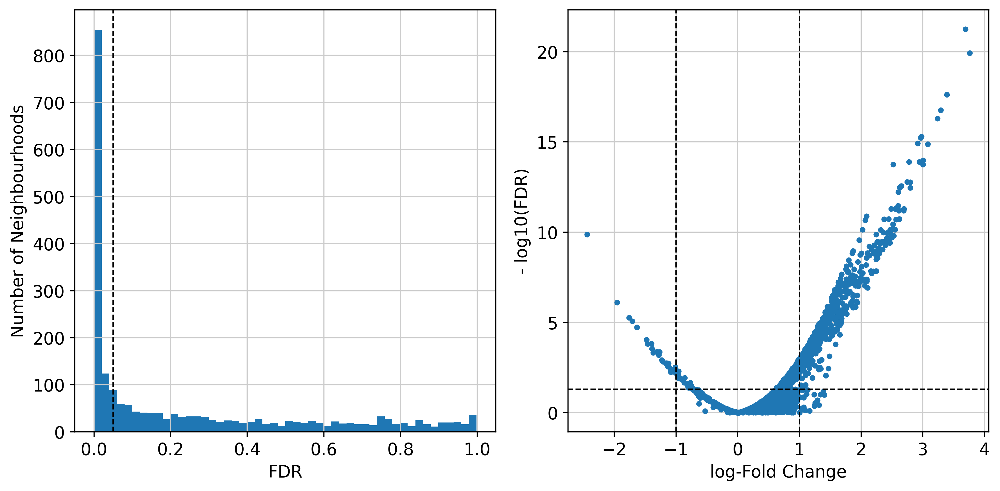

In [27]:
old_figsize = plt.rcParams["figure.figsize"]
plt.rcParams["figure.figsize"] = [10,5]
plt.subplot(1,2,1)
plt.hist(adata_ec.uns["nhood_adata"].obs.FDR, bins=50);
plt.xlabel("FDR");
plt.axvline(x = 0.05, color='k', linestyle='dashed', linewidth=1)
plt.ylabel("Number of Neighbourhoods");


plt.subplot(1,2,2)
plt.plot(adata_ec.uns["nhood_adata"].obs.logFC, -np.log10(adata_ec.uns["nhood_adata"].obs.FDR), '.');
plt.xlabel("log-Fold Change");
plt.ylabel("- log10(FDR)");
plt.axvline(x = 1, color='k', linestyle='dashed', linewidth=1)
plt.axvline(x = -1, color='k', linestyle='dashed', linewidth=1)
plt.axhline(y = 1.30, color='k', linestyle='dashed', linewidth=1)

plt.tight_layout()
plt.rcParams["figure.figsize"] = old_figsize

old_figsize = plt.rcParams["figure.figsize"]
plt.rcParams["figure.figsize"] = [10,5]
plt.subplot(1,2,1)
plt.hist(adata_ec.uns["nhood_adata"].obs.PValue, bins=50);
plt.xlabel("P-Vals");
plt.subplot(1,2,2)
plt.plot(adata_ec.uns["nhood_adata"].obs.logFC, -np.log10(adata_ec.uns["nhood_adata"].obs.SpatialFDR), '.');
plt.xlabel("log-Fold Change");
plt.ylabel("- log10(Spatial FDR)");
plt.tight_layout()
plt.rcParams["figure.figsize"] = old_figsize

In [28]:
import milopy.utils
milopy.utils.build_nhood_graph(adata_ec)

/rds/general/user/snb20/home/anaconda3/envs/MiloPy/lib/python3.9/site-packages/anndata/_core/anndata.py:1113: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


/rds/general/user/snb20/home/anaconda3/envs/MiloPy/lib/python3.9/site-packages/anndata/_core/anndata.py:1113: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/rds/general/user/snb20/home/anaconda3/envs/MiloPy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):


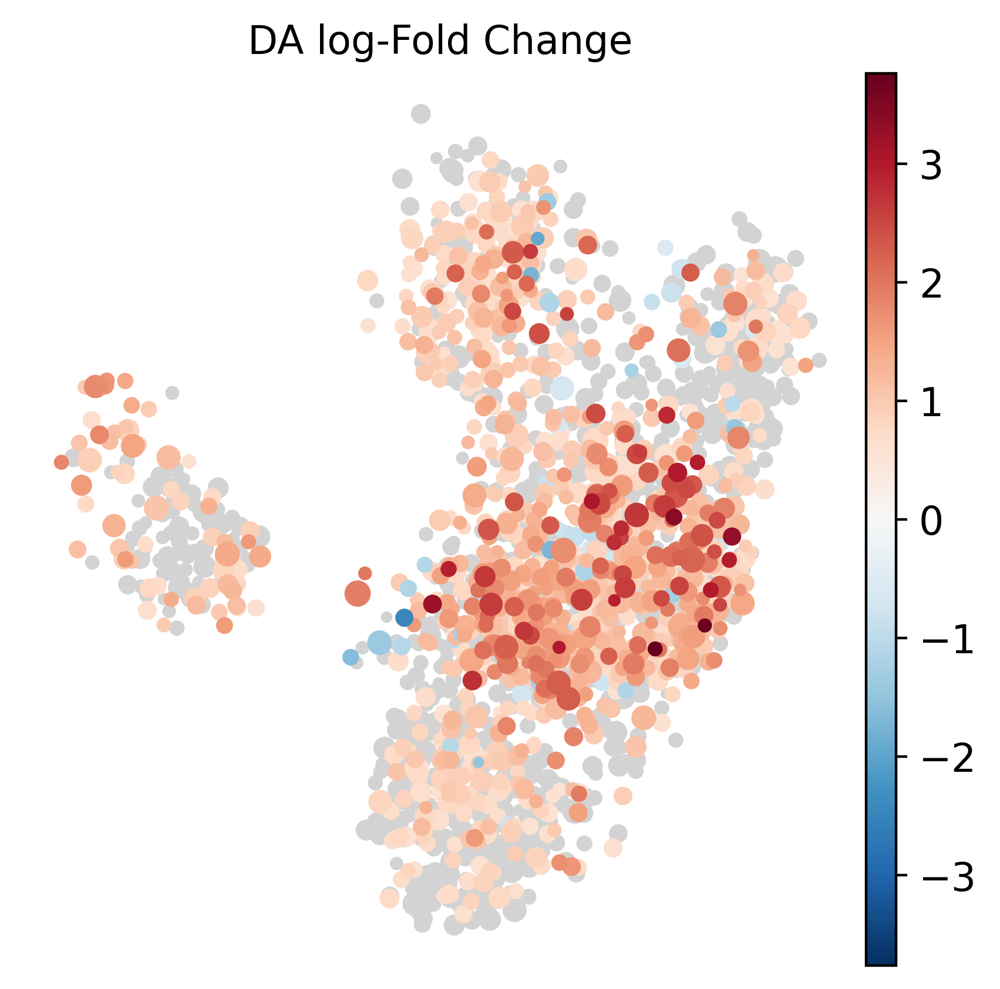

In [29]:
plt.rcParams["figure.figsize"] = [5,5]
milopl.plot_nhood_graph(adata_ec, 
                        alpha=0.1, ## SpatialFDR level (1%) 
                        min_size=0.25, ## Size of smallest dot,
                        palette = 'seismic'
                       )

### Visualize result by celltype

In [38]:
milopy.utils.annotate_nhoods(adata_ec, anno_col='cell_states')

Text(0.5, 0, 'celltype fraction')

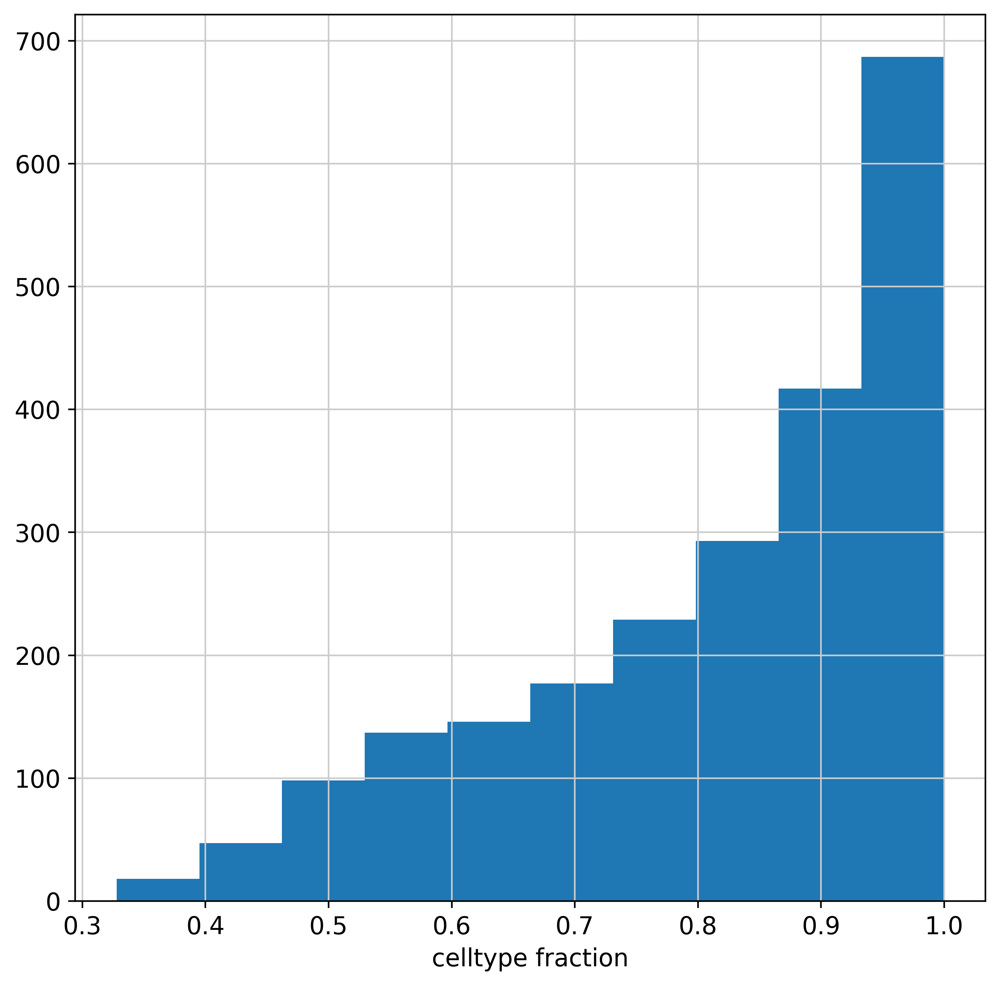

In [39]:
plt.hist(adata_ec.uns['nhood_adata'].obs["nhood_annotation_frac"]);
plt.xlabel("celltype fraction")

In [40]:
adata_ec.uns['nhood_adata']

AnnData object with n_obs × n_vars = 2249 × 159
    obs: 'index_cell', 'kth_distance', 'logFC', 'logCPM', 'F', 'PValue', 'FDR', 'SpatialFDR', 'Nhood_size', 'nhood_annotation', 'nhood_annotation_frac'
    var: 'health_status_continuous', 'samples'
    uns: 'sample_col', 'nhood', 'annotation_labels', 'annotation_obs'
    obsm: 'X_milo_graph', 'frac_annotation'
    obsp: 'nhood_connectivities'

In [41]:
### change to string
adata_ec.uns['nhood_adata'].obs["nhood_annotation"] = adata_ec.uns['nhood_adata'].obs["nhood_annotation"].astype(str)

In [42]:
adata_ec.uns['nhood_adata'].obs.loc[adata_ec.uns['nhood_adata'].obs["nhood_annotation_frac"] < 0.6, "nhood_annotation"] = "Mixed"

In [106]:
### change back to category
adata.uns['nhood_adata'].obs["nhood_annotation"] = adata.uns['nhood_adata'].obs["nhood_annotation"].astype("category")

In [43]:
adata_ec.uns['nhood_adata'].obs["nhood_annotation"]

0       EC.Venous.Pul
1        EC.Capillary
2               Mixed
3       EC.Venous.Pul
4         EC.Arterial
            ...      
2244     EC.Capillary
2245     EC.Lymphatic
2246            Mixed
2247     EC.Capillary
2248            Mixed
Name: nhood_annotation, Length: 2249, dtype: object

In [112]:
del adata.uns['nhood_adata'].uns["nhood_annotation_colors"]

In [44]:
adata

AnnData object with n_obs × n_vars = 63841 × 34091
    obs: 'nCount_RNA', 'nFeature_RNA', 'cell.id', 'study.batch', 'donor', 'samples', 'sex', 'age', 'ethnicity', 'smoking_status', 'health_status', 'region', 'version_10X', 'scn_source', 'cell_type_bharat20', 'cell_states_bharat20', 'cell_type_delorey21', 'cell_states_delorey21', 'cell_type_melms21', 'cell_states_melms21', 'cell_type_SatijaAtlas', 'original_annotation', 'scn_source_study.batch', 'donor_study.batch', 'samples_study.batch', 'percent_mito', 'percent_ribo', 'scrublet.scores_samples', 'scrublet.predicted_db_samples', 'scDblFinder.score_samples', 'scDblFinder.predicted_db_samples', 'nCount_SCT', 'nFeature_SCT', 'integrated_snn_res.0.1', 'seurat_clusters', 'health_status_entropy.seurat', 'scn_source_entropy.seurat', 'scn_source_study.batch_entropy.seurat', 'donor_study.batch_entropy.seurat', 'samples_study.batch_entropy.seurat', 'health_status_entropy.seurat.hm', 'scn_source_entropy.seurat.hm', 'scn_source_study.batch_entropy.

/rds/general/user/snb20/home/anaconda3/envs/MiloPy/lib/python3.9/site-packages/scanpy/plotting/_anndata.py:770: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(adata.obs[groupby]):
/rds/general/user/snb20/home/anaconda3/envs/MiloPy/lib/python3.9/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/rds/general/user/snb20/home/anaconda3/envs/MiloPy/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)
/rds/general/user/snb20/

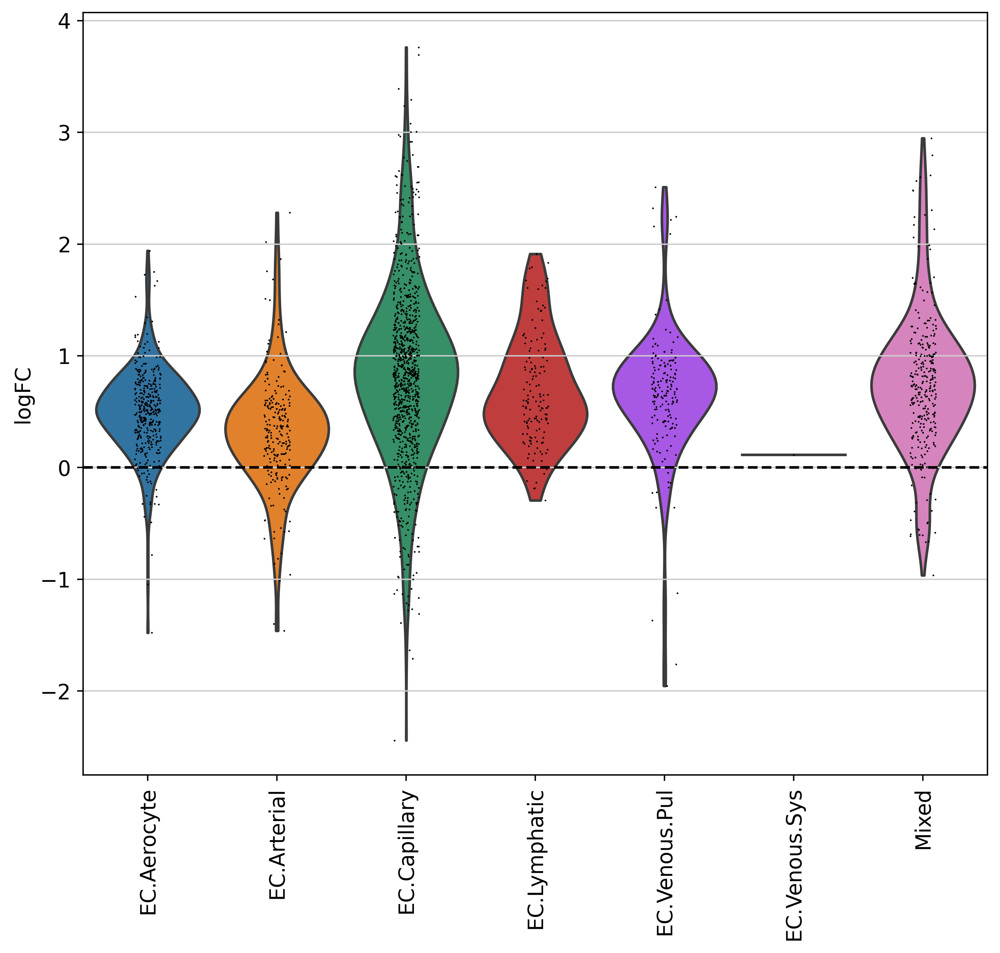

In [45]:
sc.pl.violin(adata_ec.uns['nhood_adata'], "logFC", groupby="nhood_annotation", rotation=90, show=False);
plt.axhline(y=0, color='black', linestyle='--');
plt.show()

In [46]:
df = adata_ec.uns["nhood_adata"].obs

In [47]:
df

,index_cell,kth_distance,logFC,logCPM,F,PValue,FDR,SpatialFDR,Nhood_size,nhood_annotation,nhood_annotation_frac
0,HD67_GCGCGATAGACGCAAC_1_1,12.148106,-1.954209,10.377109,31.021937,5.587074e-08,7.853331e-07,7.925633e-07,348.0,EC.Venous.Pul,0.876437
1,HD68_AGCTCCTGTAAGTAGT_1_1,10.892006,0.187153,10.113635,0.327473,5.673841e-01,6.653008e-01,6.621959e-01,203.0,EC.Capillary,0.674877
2,HD70_CATCGAACAGTATAAG_1_1,10.953557,-0.964496,10.324928,9.088898,2.721762e-03,8.408301e-03,8.321231e-03,322.0,Mixed,0.562112
3,F01366_CAGGTGCGTGACGCCT_1_1,12.217417,-1.761817,10.386235,26.270954,5.208871e-07,5.525825e-06,5.580016e-06,300.0,EC.Venous.Pul,0.900000
4,081C_GACGTGCTCCAGATCA_2_1,7.453043,0.483010,10.893264,2.991400,8.426767e-02,1.475997e-01,1.462613e-01,703.0,EC.Arterial,0.975818
...,...,...,...,...,...,...,...,...,...,...,...
2244,TGTTGGAGTGCTAGCC-1_3_1_5,6.902302,0.880930,10.635836,10.477159,1.281201e-03,4.516333e-03,4.478605e-03,530.0,EC.Capillary,0.886792
2245,AAGATAGTCCCATACC-1_2_5,7.237426,0.225613,11.155520,0.513270,4.740321e-01,5.797163e-01,5.764126e-01,501.0,EC.Lymphatic,1.000000
2246,GGTCACGGTACTTCCC-1_2_5,9.066359,1.182798,10.574058,17.993238,2.600261e-05,1.675641e-04,1.666968e-04,427.0,Mixed,0.430913
2247,TCATCATAGCTGTCCG-1_2_5,8.157048,0.876955,10.331190,9.015002,1.146928e-01,1.892795e-01,1.878060e-01,304.0,EC.Capillary,0.651316


In [53]:
df2 = df[(df['logFC']>=1) + (df['logFC']<=-1)].copy()

In [54]:
df3 = df2[(df2['FDR']<=0.05)].copy()

/rds/general/user/snb20/home/anaconda3/envs/MiloPy/lib/python3.9/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/rds/general/user/snb20/home/anaconda3/envs/MiloPy/lib/python3.9/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/rds/general/user/snb20/home/anaconda3/envs/MiloPy/lib/python3.9/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/rds/general/user/snb20/home/anaconda3/envs/MiloPy/lib/python3.9/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_c

<Axes: xlabel='logFC', ylabel='nhood_annotation'>

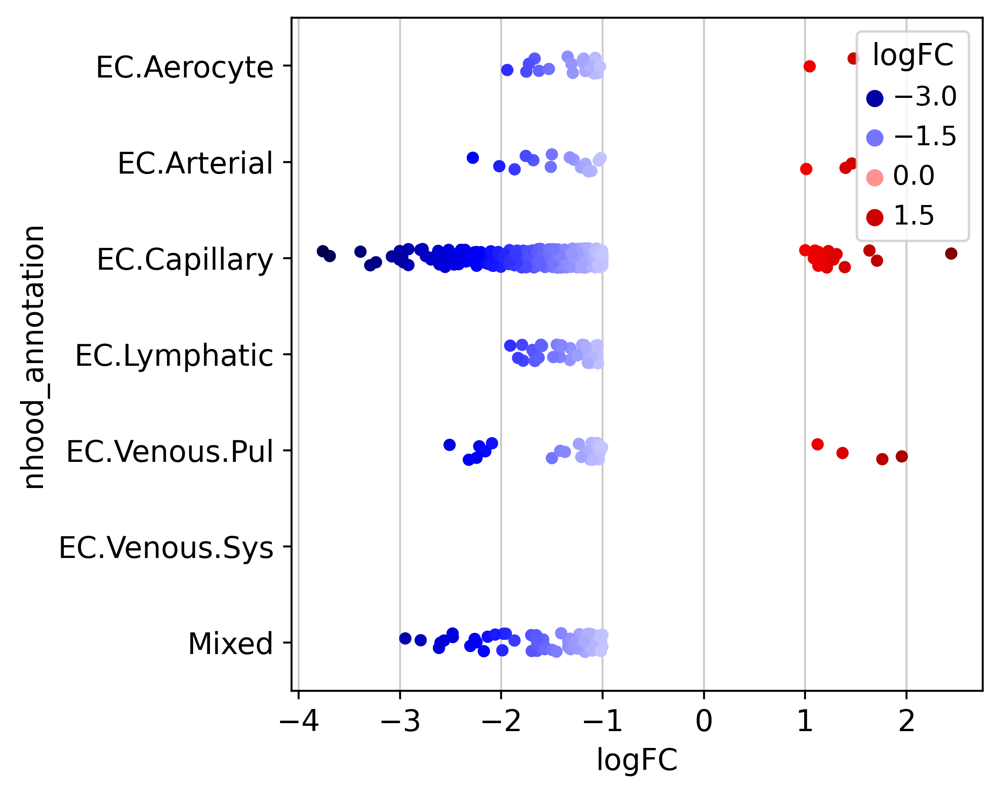

In [55]:
sns.stripplot(data = df3, x = 'logFC', y = 'nhood_annotation', hue = 'logFC', palette = 'seismic')

In [54]:
df["significant"] = df["logFC"]
df

,index_cell,kth_distance,logFC,logCPM,F,PValue,FDR,SpatialFDR,Nhood_size,nhood_annotation,nhood_annotation_frac,significant
0,HD67_GCGCGATAGACGCAAC_1_1,12.148106,-1.954209,10.377109,31.021937,5.587074e-08,7.853331e-07,7.925633e-07,348.0,EC.Venous.Pul,0.876437,-1.954209
1,HD68_AGCTCCTGTAAGTAGT_1_1,10.892006,0.187153,10.113635,0.327473,5.673841e-01,6.653008e-01,6.621959e-01,203.0,EC.Capillary,0.674877,0.187153
2,HD70_CATCGAACAGTATAAG_1_1,10.953557,-0.964496,10.324928,9.088898,2.721762e-03,8.408301e-03,8.321231e-03,322.0,Mixed,0.562112,-0.964496
3,F01366_CAGGTGCGTGACGCCT_1_1,12.217417,-1.761817,10.386235,26.270954,5.208871e-07,5.525825e-06,5.580016e-06,300.0,EC.Venous.Pul,0.900000,-1.761817
4,081C_GACGTGCTCCAGATCA_2_1,7.453043,0.483010,10.893264,2.991400,8.426767e-02,1.475997e-01,1.462613e-01,703.0,EC.Arterial,0.975818,0.483010
...,...,...,...,...,...,...,...,...,...,...,...,...
2244,TGTTGGAGTGCTAGCC-1_3_1_5,6.902302,0.880930,10.635836,10.477159,1.281201e-03,4.516333e-03,4.478605e-03,530.0,EC.Capillary,0.886792,0.880930
2245,AAGATAGTCCCATACC-1_2_5,7.237426,0.225613,11.155520,0.513270,4.740321e-01,5.797163e-01,5.764126e-01,501.0,EC.Lymphatic,1.000000,0.225613
2246,GGTCACGGTACTTCCC-1_2_5,9.066359,1.182798,10.574058,17.993238,2.600261e-05,1.675641e-04,1.666968e-04,427.0,Mixed,0.430913,1.182798
2247,TCATCATAGCTGTCCG-1_2_5,8.157048,0.876955,10.331190,9.015002,1.146928e-01,1.892795e-01,1.878060e-01,304.0,EC.Capillary,0.651316,0.876955


In [56]:
df.to_csv("/rds/general/user/snb20/home/3_COVID19/Thesis/milo/ec_milo_data.csv")

In [58]:
df = pd.read_csv("/rds/general/user/snb20/home/3_COVID19/Thesis/milo/ec_milo_data.csv")

In [59]:
df

,Unnamed: 0,index_cell,kth_distance,logFC,logCPM,F,PValue,FDR,SpatialFDR,Nhood_size,nhood_annotation,nhood_annotation_frac,significant,FDR_sig,Condition
0,2,HD70_CATCGAACAGTATAAG_1_1,10.953557,-0.964496,10.324928,9.088898,2.721762e-03,8.408301e-03,8.321231e-03,322,Mixed,0.562112,-0.964496,8.410000e-03,NS
1,1,HD68_AGCTCCTGTAAGTAGT_1_1,10.892006,0.187153,10.113635,0.327473,5.673841e-01,6.653008e-01,6.621959e-01,203,EC.Capillary,0.674877,0.187153,6.650000e-01,NS
2,5,244C_CTACCCAGTCATTAGC_2_1,8.256186,0.926953,10.775604,11.662488,6.846890e-04,2.654942e-03,2.626038e-03,555,EC.Venous.Pul,0.711712,0.926953,2.650000e-03,NS
3,21,P2_7_AGGTCATGTCTAAAGA_1,9.704984,-0.867675,10.044489,7.028812,8.251594e-03,2.140465e-02,2.118838e-02,281,EC.Capillary,0.839858,-0.867675,2.140000e-02,NS
4,4,081C_GACGTGCTCCAGATCA_2_1,7.453043,0.483010,10.893264,2.991400,8.426767e-02,1.475997e-01,1.462613e-01,703,EC.Arterial,0.975818,0.483010,1.480000e-01,NS
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2244,2232,GGTCTGGTCTATTCGT-1_27,6.511020,1.855654,10.754052,45.207176,4.440000e-11,1.470000e-09,1.510000e-09,580,EC.Capillary,0.872414,1.855654,1.470000e-09,COVID.19 enriched
2245,2245,AAGATAGTCCCATACC-1_2_5,7.237426,0.225613,11.155520,0.513270,4.740321e-01,5.797163e-01,5.764126e-01,501,EC.Lymphatic,1.000000,0.225613,5.800000e-01,NS
2246,2235,CTCAGAAGTAAGAACT-1_27,8.481668,1.485222,10.303208,26.058811,1.461340e-04,7.402130e-04,7.321550e-04,382,EC.Capillary,0.882199,1.485222,7.400000e-04,COVID.19 enriched
2247,2247,TCATCATAGCTGTCCG-1_2_5,8.157048,0.876955,10.331190,9.015002,1.146928e-01,1.892795e-01,1.878060e-01,304,EC.Capillary,0.651316,0.876955,1.890000e-01,NS


In [ ]:
df.['significant'] = adata.obs['significant'].str.replace('lung','lung_2')

/rds/general/user/snb20/home/anaconda3/envs/MiloPy/lib/python3.9/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/rds/general/user/snb20/home/anaconda3/envs/MiloPy/lib/python3.9/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/rds/general/user/snb20/home/anaconda3/envs/MiloPy/lib/python3.9/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/rds/general/user/snb20/home/anaconda3/envs/MiloPy/lib/python3.9/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_c

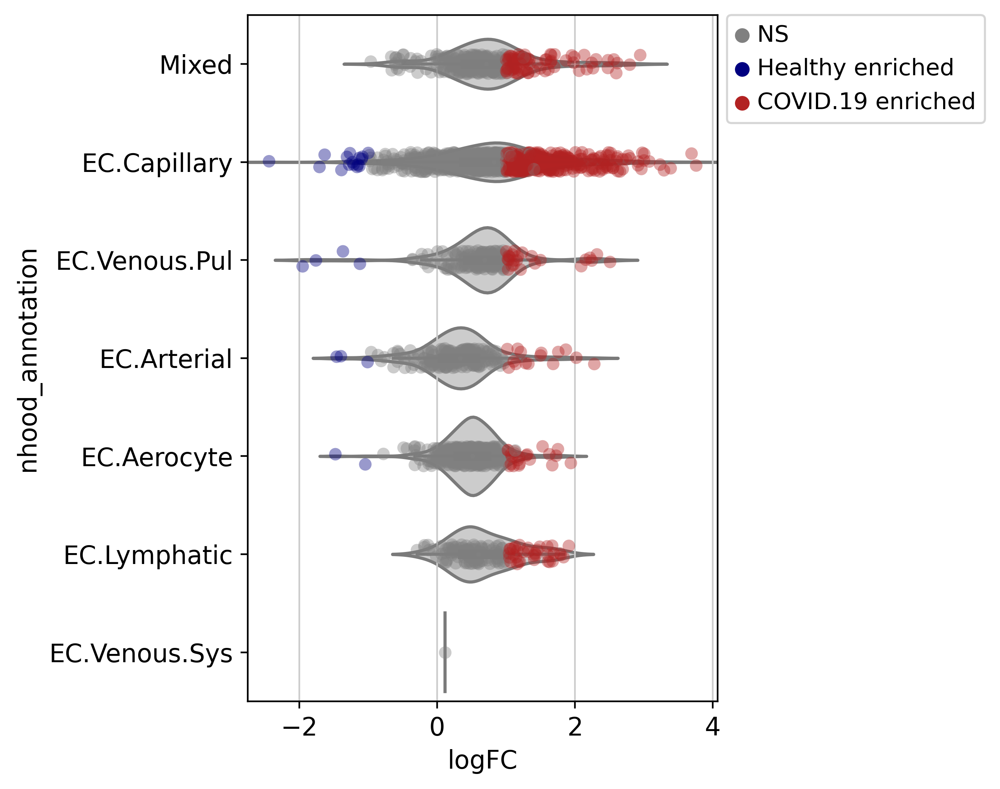

In [114]:
plt.rcParams["figure.figsize"] = [4,6]

sns.violinplot(data = df, x="logFC", y="nhood_annotation", color="0.8")
sns.stripplot(data = df, x = 'logFC', y = 'nhood_annotation', hue = 'Condition', palette = ["grey","navy","firebrick"], alpha = 0.4, size = 6)
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)


/rds/general/user/snb20/home/anaconda3/envs/MiloPy/lib/python3.9/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/rds/general/user/snb20/home/anaconda3/envs/MiloPy/lib/python3.9/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/rds/general/user/snb20/home/anaconda3/envs/MiloPy/lib/python3.9/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/rds/general/user/snb20/home/anaconda3/envs/MiloPy/lib/python3.9/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_c

<Axes: xlabel='logFC', ylabel='nhood_annotation'>

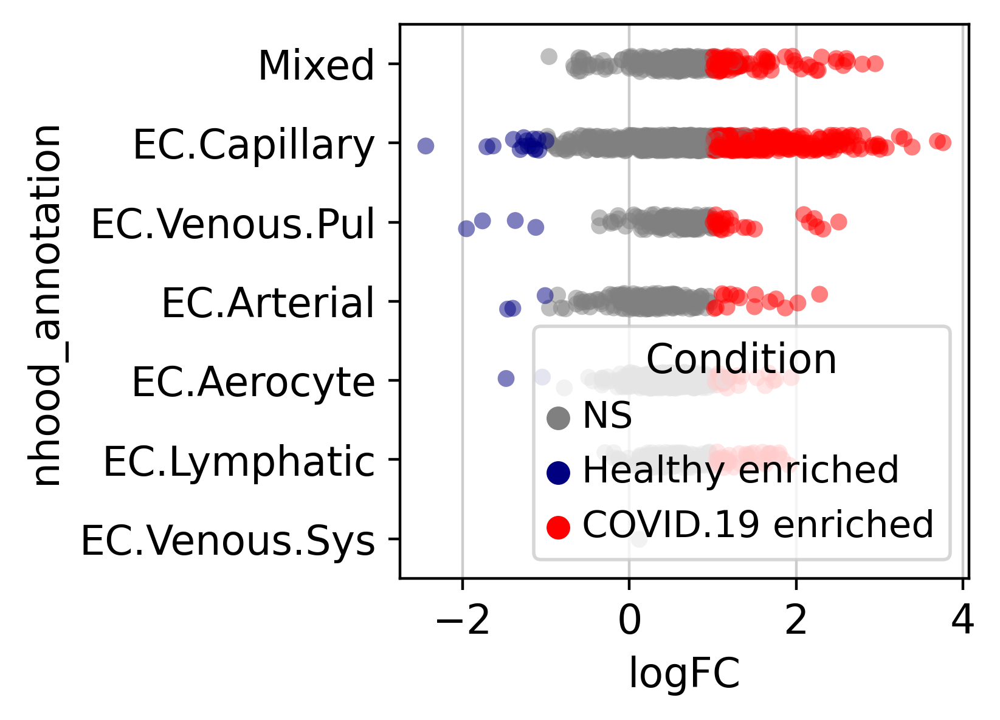

In [75]:
sns.stripplot(data = df, x = 'logFC', y = 'nhood_annotation', hue = 'Condition', palette = ["grey","navy","red"], alpha = 0.5)

In [72]:
df['nhood_annotation'] = df['nhood_annotation'].cat.reorder_categories(['EC.Aerocyte',"EC.Arterial","EC.Capillary","EC.Lymphatic","EC.Venous.Pul","EC.Venous.Sys","Mixed", 'COVID.19'])

AttributeError: Can only use .cat accessor with a 'category' dtype